In [1]:
import scanpy as sc
import anndata
# import scanpy.external as sce

# from PySpots.MERFISH_Objects.FISHData import *
from PySpots.fish_helpers import *
from dredFISH.Analysis import basicu
from dredFISH.Analysis import TissueGraph as tgh
importlib.reload(tgh)

sc.set_figure_params(figsize=(7, 7))

In [25]:
prj_dir = '/bigstore/GeneralStorage/fangming/projects/dredfish/'
dat_dir = prj_dir + 'data/'
res_dir = prj_dir + 'data_dump/'
fig_dir = prj_dir + 'figures/'

output_csv = f'{res_dir}noHarmony_March30_v2.csv'
print(output_csv)

/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/noHarmony_March30.csv


In [3]:
# dredFISH data
dataset = 'DPNMF_PolyA_2021Nov19' # dataset tag
base_path = '/bigstore/Images2021/gaby/dredFISH/DPNMF_PolyA_2021Nov19/'
fish_path = f'{base_path}fishdata_2022Mar23/' # Zach's new version
# anndata_path = f'{base_path}results/raw_fishdata_Mar30.h5ad'
anndata_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/DPNMF_PolyA_2021Nov19_v2_results_anndata.h5ad'
# anndata_path = ''

scrna_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/scrna_ss_ctxhippo_a_exon_DPNMF_matrix.h5ad'

In [4]:
%%time

# load dredFISH
TMG = tgh.TissueMultiGraph(name=dataset)
# load raw counts data
if os.path.isfile(anndata_path):
    print('from AnnData')
    TMG.load_from_anndata(anndata_path)
else:
    print('from FishData')
    TMG.load_from_fishdata(fish_path, dataset, output_path=anndata_path)
# normalize (optional for spatial registration)
TMG.normalize_data(norm_cell=True, norm_bit=False)

### for now
measured_data = TMG.data
print(measured_data)
    
# allen scrna matrix
ref_SS_data = anndata.read_h5ad(scrna_path)
print(ref_SS_data)

from AnnData
AnnData object with n_obs × n_vars = 113758 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'cell_name', 'stage_x', 'stage_y', 'coord_x', 'coord_y', 'region_id', 'region_color', 'region_acronym'
    obsm: 'stage'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors', 'norm_cell'
AnnData object with n_obs × n_vars = 73347 × 24
    obs: 'donor_sex_id', 'donor_sex_label', 'donor_sex_color', 'region_id', 'region_label', 'region_color', 'platform_label', 'cluster_order', 'cluster_label', 'cluster_color', 'subclass_order', 'subclass_label', 'subclass_color', 'neighborhood_id', 'neighborhood_label', 'neighborhood_color', 'class_order', 'class_label', 'class_color', 'exp_component_name', 'external_donor_name_label', 'full_genotype_label', 'facs_population_plan_label', 'injection_roi_label', 'injection_materials_label', 'inje

In [5]:
# format it 
celltype_levels = [
    'class_label', 
    'neighborhood_label', 
    'subclass_label', 
    # 'supertype_label', 
    'cluster_label',
]

ref_SS_data.obs = ref_SS_data.obs.rename(columns={
    'class_label': 'Level_1_class_label', 
    'neighborhood_label': 'Level_2_neighborhood_label', 
    'subclass_label': 'Level_3_subclass_label', 
    # 'supertype_label', 
    'cluster_label': 'Level_5_cluster_label', # temporary
})
ref_SS_data.obsm['Level_1_class_label'] = ref_SS_data.obs['Level_1_class_label'].values.astype(object)
ref_SS_data.obsm['Level_2_neighborhood_label'] = ref_SS_data.obs['Level_2_neighborhood_label'].values.astype(object)
ref_SS_data.obsm['Level_3_subclass_label'] = ref_SS_data.obs['Level_3_subclass_label'].values.astype(object)
ref_SS_data.obsm['Level_5_cluster_label'] = ref_SS_data.obs['Level_5_cluster_label'].values.astype(object)

# store
measured_data.layers['DPNMF'] = measured_data.layers['norm_cell'] 
measured_data.obsm['stage'] = measured_data.obs[['stage_x', 'stage_y']].values  # only to fix the staging bug
ref_SS_data.layers['DPNMF'] = ref_SS_data.X

In [6]:
def zscore(v, **kwargs):
    return (v-np.mean(v, **kwargs))/(np.std(v, **kwargs))

def zscore_matrix_bycol(mat):
    return zscore(mat, axis=0) # across rows

In [7]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

class RecursiveClassify(object):
    def __init__(self,data,ref_data,level,verbose=True):
        self.data = data.copy()
        self.ref_data = ref_data.copy()
        self.level = level # current level
        self.verbose = verbose
        
    def run(self):
        self.normalizeData()
        # self.harmonizeData()
        self.classifyData()
        self.splitData()
        
    def normalizeData(self):
        
        mat = np.array(self.data.layers['DPNMF'].copy())
        ref_mat = np.array(self.ref_data.layers['DPNMF'].copy())
        
        mat = zscore_matrix_bycol(mat)
        ref_mat = zscore_matrix_bycol(ref_mat)
        
        self.data.obsm['DPNMF_IQR'] = mat.copy()
        self.ref_data.obsm['DPNMF_IQR'] = ref_mat.copy()
        
#     def harmonizeData(self):
#         merged_data = anndata.AnnData(
#             X=np.concatenate([self.data.layers['DPNMF_IQR'].astype(float),
#                               self.ref_data.layers['DPNMF_IQR'].astype(float)]),
#             var=np.array(self.data.var).astype(str),
#             obs=np.concatenate([np.array(self.data.obs.index).astype(str),
#                                 np.array(self.ref_data.obs.index).astype(str)]).astype(str)
#             )
#         merged_data.obs['dataset'] = np.concatenate([
#             np.array(['a' for i in range(len(self.data.obs))]),
#             np.array(['b' for i in range(len(self.ref_data.obs))])
#             ]).astype(str)
#         merged_data.obsm['DPNMF'] = merged_data.X.copy()
#         merged_data.layers['DPNMF'] = merged_data.X.copy()
#         merged_data.raw = merged_data

#         # sce.pp.harmony_integrate(merged_data, 'dataset',
#         #                          basis='DPNMF',
#         #                          adjusted_basis='DPNMF_harmony', 
#         #                          reference_values='b',
#         #                         )
    
#         # self.data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'a'].obsm['DPNMF_harmony'])
#         # self.ref_data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'b'].obsm['DPNMF_harmony'])
#         self.data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'a'].obsm['DPNMF'])
#         self.ref_data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'b'].obsm['DPNMF'])

    def classBalance(self, n_cells=100):
        """ Class Balance 
        select `n_cells` from each cluster without replacement
        if n_cells > cluster size, it selects **duplicated** cells 
        """
        X = self.ref_data.obsm['DPNMF_IQR'].copy()
        Y = np.array(self.ref_data.obsm[self.level])
        Y_unique = np.unique(Y)
        X_balanced = []
        Y_balanced = []
        for y in Y_unique:
            idx = np.where(Y==y)[0]
            if idx.shape[0]>n_cells:
                idx = np.random.choice(idx,n_cells,replace=False)
            else:
                idx = np.random.choice(idx,n_cells,replace=True)
            X_balanced.append(X[idx,:])
            Y_balanced.append(Y[idx])
        self.X_balanced = np.concatenate(X_balanced)
        self.Y_balanced = np.concatenate(Y_balanced)
    
    def splitTestTrain(self, test_size=0.4, random_state=42, **kwargs):
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            self.X_balanced, self.Y_balanced, 
            test_size=test_size, 
            random_state=random_state,
            **kwargs,
        )
        
    def buildModel(self, n_neighbors=15, metric='correlation', **kwargs):
        self.method = 'KNeighborsClassifier'
        self.model =  KNeighborsClassifier(n_neighbors=n_neighbors, metric=metric, **kwargs)
        
    def trainModel(self):
        self.model.fit(self.X_train, self.y_train)
        
    def predictLabels(self):
        self.data.obs[self.level+'_predicted'] = self.model.predict(self.data.obsm['DPNMF_IQR'].copy())
        
    def classifyData(self):
        self.classBalance()
        self.splitTestTrain()
        self.buildModel()
        self.trainModel()
        self.predictLabels()
        
    def splitData(self):
        """
        """
        levels = np.array([i for i in self.ref_data.obsm if i.split('_')[0]=='Level'])
        for level in levels:
            self.ref_data.obs[level] = np.array(self.ref_data.obsm[level])
        loc = np.where(levels==self.level)[0][0]+1
        if loc>=len(levels):
            """ No More Levels"""
        else:
            next_level = levels[loc]
            self.data.obs[next_level+'_predicted'] = np.array(['Unknown' for i in range(self.data.shape[0])])
            ref_data_labels = np.array(self.ref_data.obs[self.level])
            data_labels = np.array(self.data.obs[self.level+'_predicted'])
            unique_labels = np.unique(data_labels)
            if self.verbose:
                if self.level ==levels[0]:
                    level = self.level
                else:
                    previous_level = levels[loc-2]
                    level = self.level + '_' + str(np.unique(self.ref_data.obs[previous_level])[0])
                iterable = tqdm(unique_labels,desc=level)
            else:
                iterable = unique_labels
            for label in iterable:
                try:
                    self.rc = RecursiveClassify(self.data[data_labels==label].copy(),
                                                self.ref_data[ref_data_labels==label].copy(),
                                                next_level,
                                                verbose=self.verbose)
                    self.rc.run()
                except Exception as e:
                    print(e)
                    print(label+'_Failed')
                for level in levels:
                        if level+'_predicted' in self.rc.data.obs:
                            if not level+'_predicted' in self.data.obs:
                                self.data.obs[level+'_predicted'] = np.array(['Unknown' for i in range(self.data.shape[0])])
                            try:
                                temp = np.array(self.data.obs[level+'_predicted'])
                                temp[data_labels==label] = np.array(self.rc.data.obs[level+'_predicted'])
                                self.data.obs[level+'_predicted'] = temp
                            except:
                                print(level+'_predicted '+label)
                                continue

In [8]:
data = measured_data.copy()
ref_data = ref_SS_data.copy()# _balanced.copy()
levels = [i for i in ref_data.obsm if i.split('_')[0]=='Level']           
data.shape, ref_data.shape, levels

((113758, 24),
 (73347, 24),
 ['Level_1_class_label',
  'Level_2_neighborhood_label',
  'Level_3_subclass_label',
  'Level_5_cluster_label'])

In [9]:
rc = RecursiveClassify(data,
                       ref_data,
                       levels[0],
                       verbose=True)
rc.run()    

Level_2_neighborhood_label_GABAergic:   0%|          | 0/3 [00:00<?, ?it/s]

Level_3_subclass_label_CGE:   0%|          | 0/3 [00:00<?, ?it/s]

Level_3_subclass_label_CGE:  33%|███▎      | 1/3 [00:00<00:00,  2.44it/s]

Level_3_subclass_label_CGE:  67%|██████▋   | 2/3 [00:00<00:00,  2.62it/s]

Level_3_subclass_label_CGE: 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

Level_2_neighborhood_label_GABAergic:  33%|███▎      | 1/3 [00:01<00:03,  1.99s/it]

Level_3_subclass_label_MGE:   0%|          | 0/3 [00:00<?, ?it/s]/tmp/ipykernel_623744/3588643244.py:2: RuntimeWarning:

invalid value encountered in true_divide

/tmp/ipykernel_623744/3588643244.py:2: RuntimeWarning:

invalid value encountered in true_divide



Level_3_subclass_label_MGE: 100%|██████████| 3/3 [00:00<00:00, 13.23it/s]

Level_2_neighborhood_label_GABAergic:  67%|██████▋   | 2/3 [00:03<00:01,  1.54s/it]

Input contains NaN, infinity or a value too large for dtype('float32').
Pvalb_Failed
Input contains NaN, infinity or a value too large for dtype('float32').
Sst_Failed




Level_3_subclass_label_Other:   0%|          | 0/1 [00:00<?, ?it/s]

Level_3_subclass_label_Other: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

Level_2_neighborhood_label_Glutamatergic:   0%|          | 0/6 [00:00<?, ?it/s]

Level_3_subclass_label_DG/SUB/CA:   0%|          | 0/5 [00:00<?, ?it/s]

Level_3_subclass_label_DG/SUB/CA:  20%|██        | 1/5 [00:00<00:00,  5.85it/s]

Level_3_subclass_label_DG/SUB/CA:  60%|██████    | 3/5 [00:00<00:00, 10.76it/s]

Level_3_subclass_label_DG/SUB/CA: 100%|██████████| 5/5 [00:00<00:00,  9.16it/s]

Level_2_neighborhood_label_Glutamatergic:  17%|█▋        | 1/6 [00:00<00:04,  1.03it/s]

Level_3_subclass_label_L2/3 IT:   0%|          | 0/7 [00:00<?, ?it/s]

Level_3_subclass_label_L2/3 IT:  29%|██▊       | 2/7 [00:00<00:00, 12.66it/s]

Level_3_subclass_label_L2/3 IT:  57%|█████▋    | 4/7 [00:00<00:00,  6.12it/s]

Level_3_subclass_label_L2/3 IT:  71%|███████▏  | 5/7 [00:00<00:00,  6.00it/s]

Level_3_subclass_label_L2/3 IT: 100%|██████████| 7/7 [00:0

In [19]:
rescols = rc.data.obs.filter(regex='_predicted$').columns
rescols = np.hstack([rescols.values, ['coord_x', 'coord_y', 'region_id', 'region_acronym', 'region_color']])
res = rc.data.obs[rescols].copy()
res


,Level_1_class_label_predicted,Level_2_neighborhood_label_predicted,Level_3_subclass_label_predicted,Level_5_cluster_label_predicted,coord_x,coord_y,region_id,region_acronym,region_color
DPNMF_PolyA_2021Nov19_Pos98_cell_1.0,Glutamatergic,Other,CR,1_CR,3066.632792,582.574703,574,CP,#98D6F9
DPNMF_PolyA_2021Nov19_Pos98_cell_2.0,Non-Neuronal,Other,SMC-Peri,382_SMC-Peri,3013.860099,578.800986,1202,int,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_3.0,Glutamatergic,Other,CR,1_CR,2835.027489,571.977073,1218,ar,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_4.0,Glutamatergic,Other,CR,1_CR,2784.899438,570.399427,1218,ar,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_5.0,Glutamatergic,DG/SUB/CA,DG,364_DG,2773.655749,566.644009,1218,ar,#CCCCCC
...,...,...,...,...,...,...,...,...,...
DPNMF_PolyA_2021Nov19_Pos102_cell_1357.0,Glutamatergic,NP/CT/L6b,L6 CT CTX,282_L6 CT CTX,2962.233204,-1423.737878,1200,ccs,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos102_cell_1358.0,Glutamatergic,NP/CT/L6b,L6 CT CTX,282_L6 CT CTX,2790.109448,-1432.947971,463,CA2,#7ED04B
DPNMF_PolyA_2021Nov19_Pos102_cell_1359.0,Glutamatergic,NP/CT/L6b,L6 CT CTX,285_L6 CT CTX,2977.062698,-1422.840896,1200,ccs,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos102_cell_1360.0,Glutamatergic,L2/3 IT,L2/3 IT ENTl,161_L2/3 IT ENTl,2999.081110,-1420.642344,1200,ccs,#CCCCCC


In [20]:
rc.data

AnnData object with n_obs × n_vars = 113758 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'cell_name', 'stage_x', 'stage_y', 'coord_x', 'coord_y', 'region_id', 'region_color', 'region_acronym', 'Level_1_class_label_predicted', 'Level_2_neighborhood_label_predicted', 'Level_3_subclass_label_predicted', 'Level_5_cluster_label_predicted'
    uns: 'Level_1_class_label_predicted_colors', 'Level_2_neighborhood_label_predicted_colors', 'Level_3_subclass_label_predicted_colors', 'Level_5_cluster_label_predicted_colors'
    obsm: 'stage', 'DPNMF_IQR', 'Level_1_class_label_predicted', 'Level_2_neighborhood_label_predicted', 'Level_3_subclass_label_predicted', 'Level_5_cluster_label_predicted'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors', 'norm_cell', 'DPNMF'

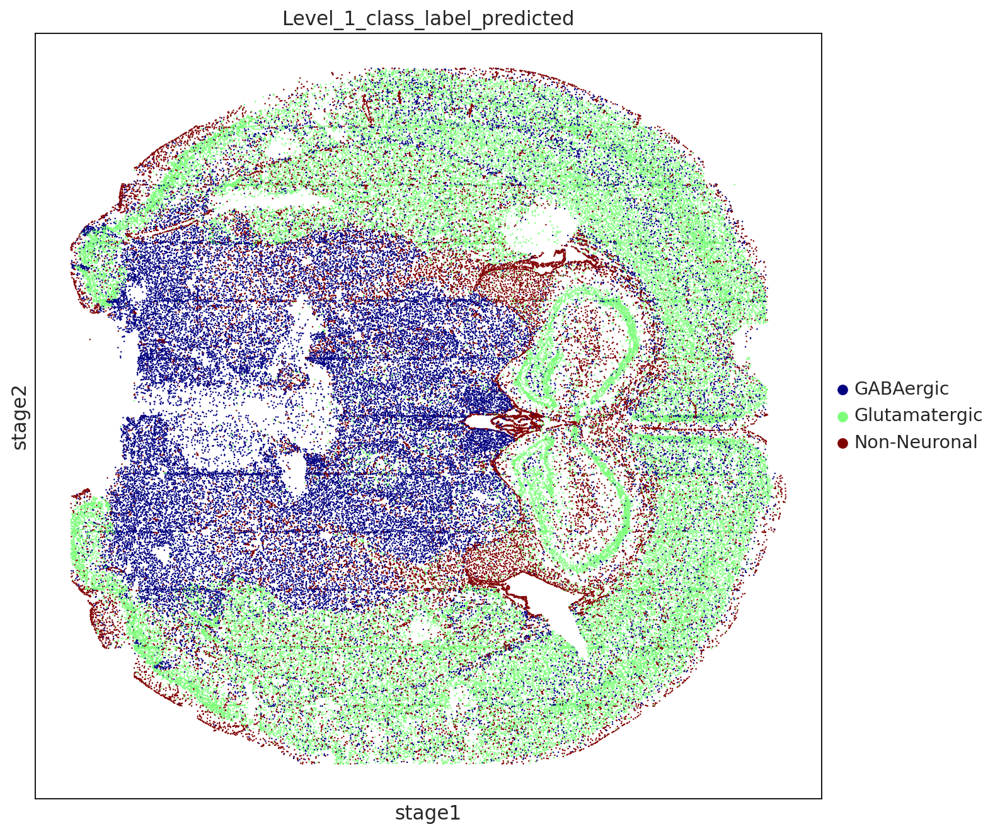

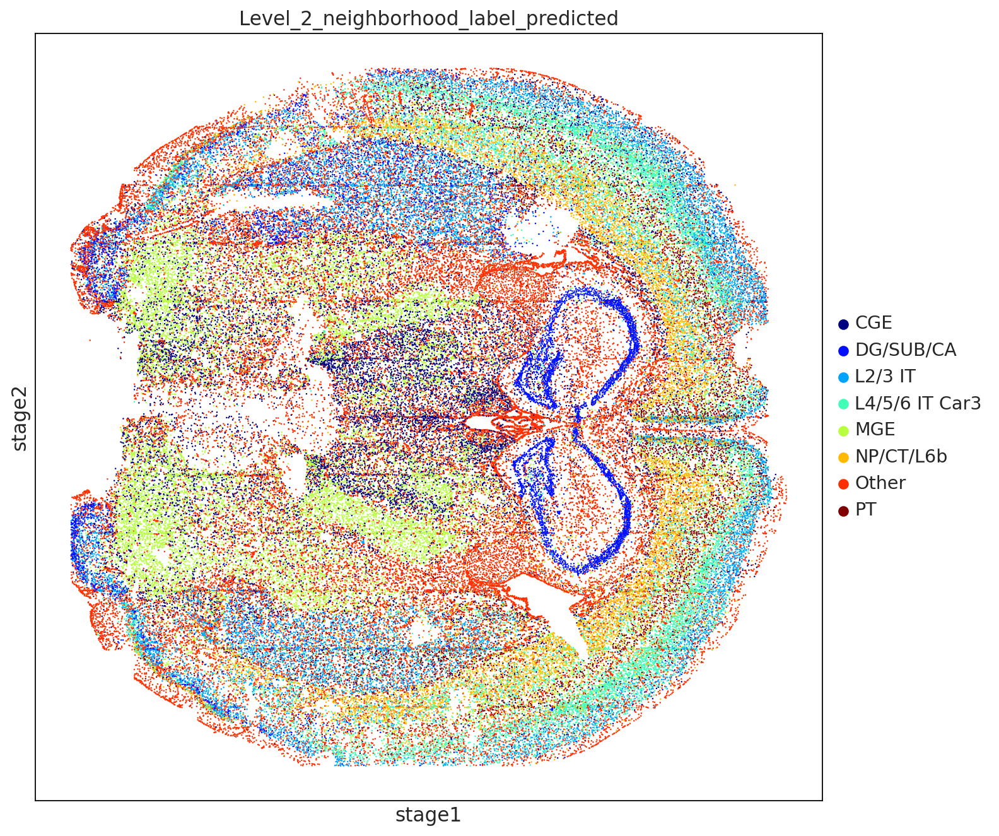

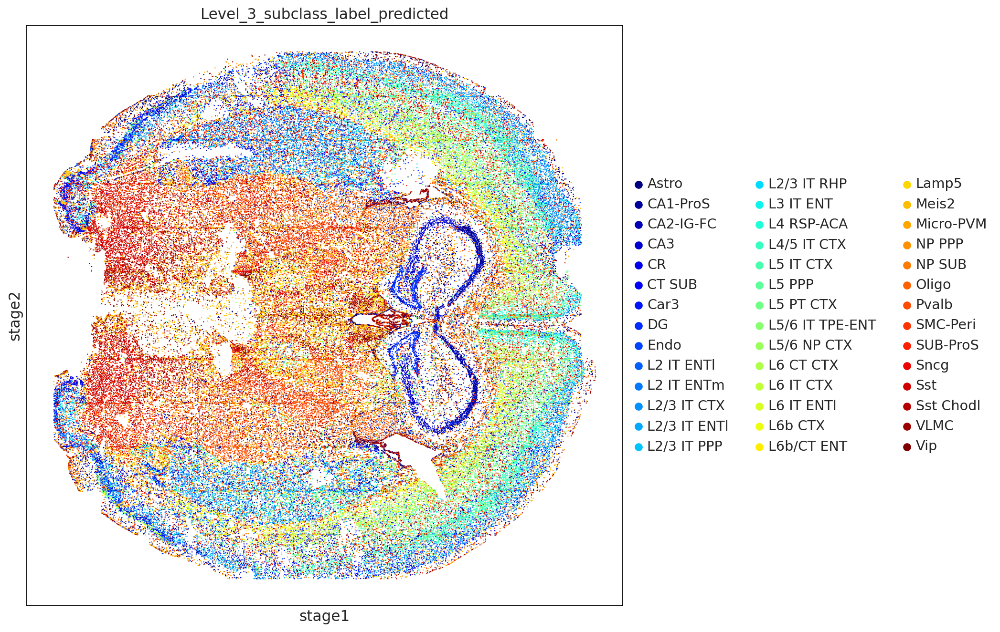

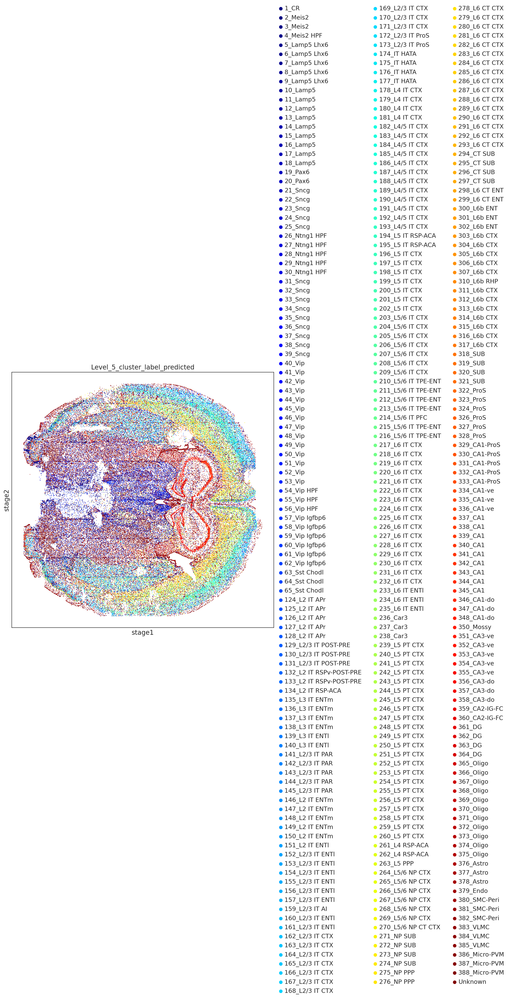

In [21]:
sc.set_figure_params(figsize=[10,10])
levels = [i for i in rc.data.obs if i.split('_')[0]=='Level']  
for level in levels:
    rc.data.obsm[level] = np.array(rc.data.obs[level])
    sc.pl.embedding(rc.data,'stage', color=[level],palette='jet',size=5)

In [26]:
res.to_csv(output_csv, header=True, index=True)

In [27]:
# !head $output_csv
!wc -l $output_csv

113759 /bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/noHarmony_March30.csv


In [28]:
!head $output_csv

,Level_1_class_label_predicted,Level_2_neighborhood_label_predicted,Level_3_subclass_label_predicted,Level_5_cluster_label_predicted,coord_x,coord_y,region_id,region_acronym,region_color
DPNMF_PolyA_2021Nov19_Pos98_cell_1.0,Glutamatergic,Other,CR,1_CR,3066.6327916763257,582.5747034367021,574,CP,#98D6F9
DPNMF_PolyA_2021Nov19_Pos98_cell_2.0,Non-Neuronal,Other,SMC-Peri,382_SMC-Peri,3013.8600985095522,578.800985781541,1202,int,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_3.0,Glutamatergic,Other,CR,1_CR,2835.027489084799,571.9770734469249,1218,ar,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_4.0,Glutamatergic,Other,CR,1_CR,2784.899438405433,570.3994273176058,1218,ar,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_5.0,Glutamatergic,DG/SUB/CA,DG,364_DG,2773.655748708345,566.6440088275306,1218,ar,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_6.0,Glutamatergic,L2/3 IT,L2/3 IT RHP,172_L2/3 IT ProS,2740.462189605623,566.2039270445364,1218,ar,#CCCCCC
DPNMF_PolyA_2021Nov19_Pos98_cell_7.0,Glutamatergic,L2/3 IT,L2/3 IT C